# Przetwarzanie wstępne. Filtracja kontekstowa.

### Cel:

- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
  - filtry liniowe dolnoprzepustowe:
    - filtr uśredniający,
    - filtr Gaussa.
  - filtry nielinowe:
    - mediana,
    - mediana dla obrazów kolorowych.
  - filtry liniowe górnoprzepustowe: - laplasjan, - operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów.
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.

1. Wczytaj obraz _plansza.png_.
   W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D` - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?


In [1]:
# %pip install scipy

In [2]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/'

fileNames = ["jet.png", "kw.png", "moon.png",
             "lenaSzum.png", "lena.png", "plansza.png"]
for fileName in fileNames:
    if not os.path.exists(fileName):
        r = requests.get(url + fileName, allow_redirects=True)
        open(fileName, 'wb').write(r.content)

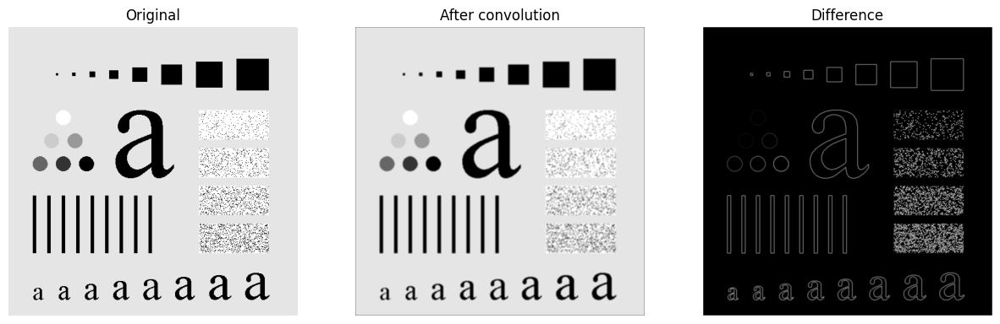

In [3]:
def read_image(file_name):
    return cv2.imread(file_name, cv2.IMREAD_GRAYSCALE)


img = read_image('plansza.png')


def filter_image_linear(img, kernel):
    return signal.convolve2d(img, kernel, mode='same')


def filter_image_nonlinear(img, kernel_size=3):
    return signal.medfilt2d(img, kernel_size)


def draw_convolution(img, kernel, f=filter_image_linear):
    filtered_img = f(img, kernel)
    _, axs = plt.subplots(1, 3, figsize=(15, 15))
    axs[0].imshow(img, cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Original')
    axs[1].imshow(filtered_img, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('After convolution')
    axs[2].imshow((np.abs(img-filtered_img)), cmap='gray')
    axs[2].axis('off')
    axs[2].set_title('Difference')


draw_convolution(img, np.ones((3, 3)) / 9)

5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35.
   Wykorzystaj polecenie `plt.subplot`.
   Przeanalizuj wpływ rozmiaru maski na wynik.


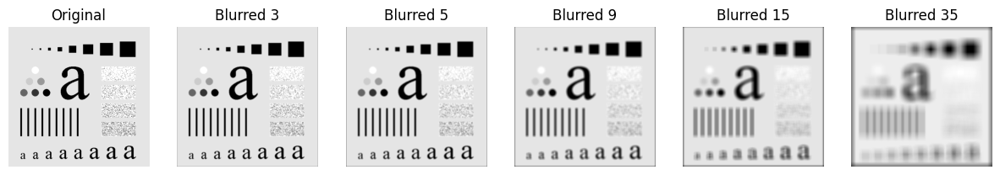

In [4]:
window_sizes = [3, 5, 9, 15, 35]
fig, axs = plt.subplots(1, 1+len(window_sizes), figsize=(15, 15))
axs[0].imshow(img, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original')
for i, window_size in enumerate(window_sizes):
    kernel = np.ones((window_size, window_size)) / window_size**2
    img_blur = filter_image_linear(img, kernel)
    axs[i+1].imshow(img_blur, cmap='gray')
    axs[i+1].axis('off')
    axs[i+1].set_title(f'Blurred {window_size}')

6. Wczytaj obraz _lena.png_.
   Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.


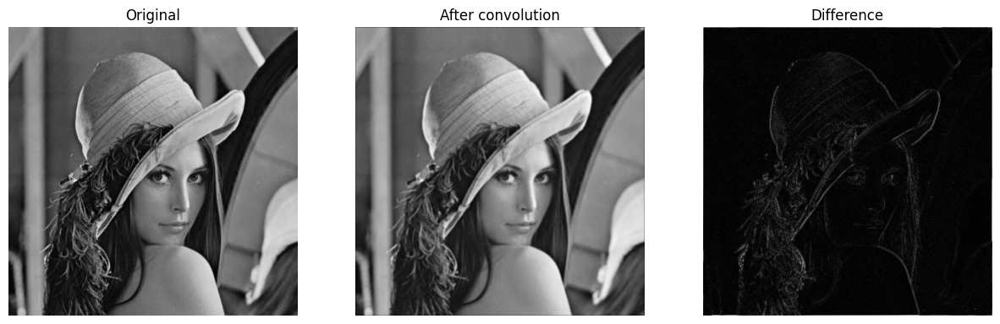

In [5]:
draw_convolution(read_image('lena.png'), np.ones((3, 3)) / 9)

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości.
   Częściowo można go zniwelować poprzez odpowiedni dobór maski.
   Wykorzystaj maskę: `M = np.array([1 2 1; 2 4 2; 1 2 1])`.
   Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
   Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
   Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.


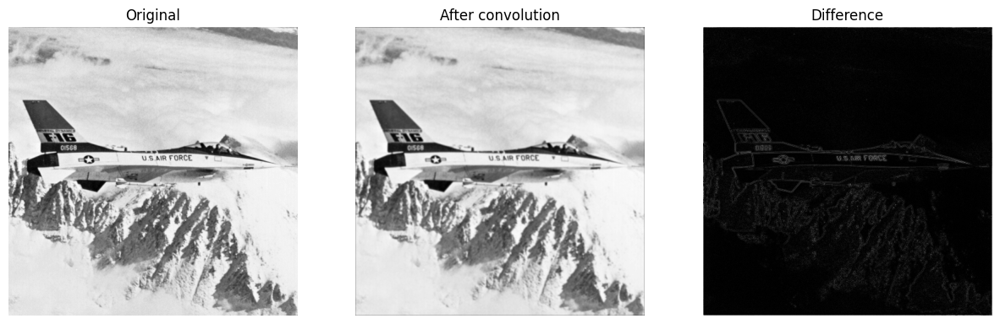

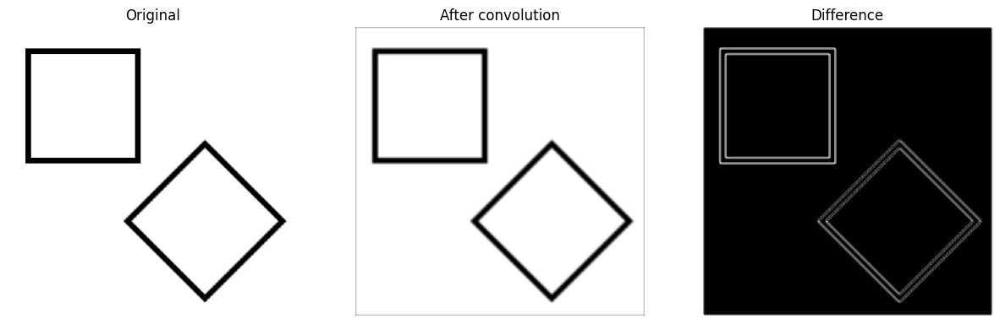

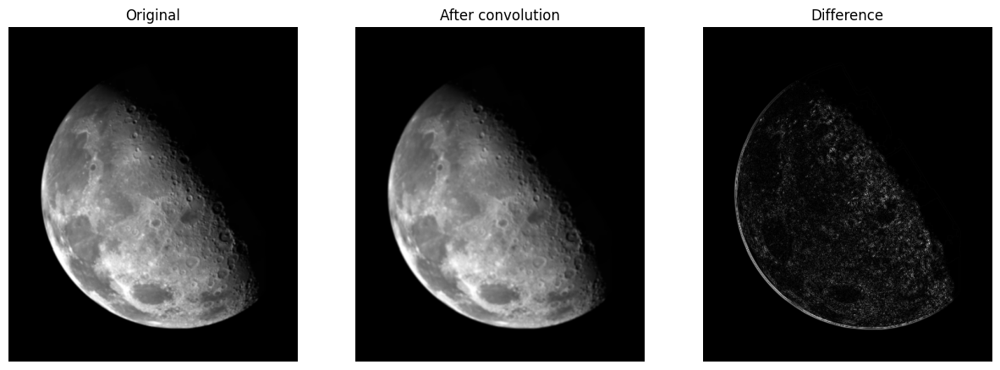

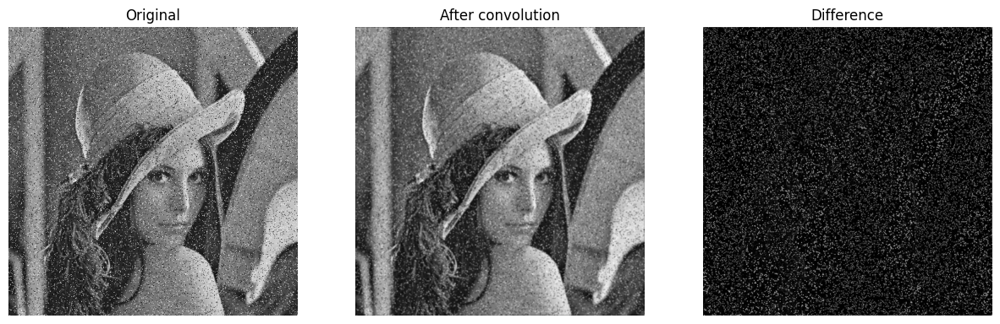

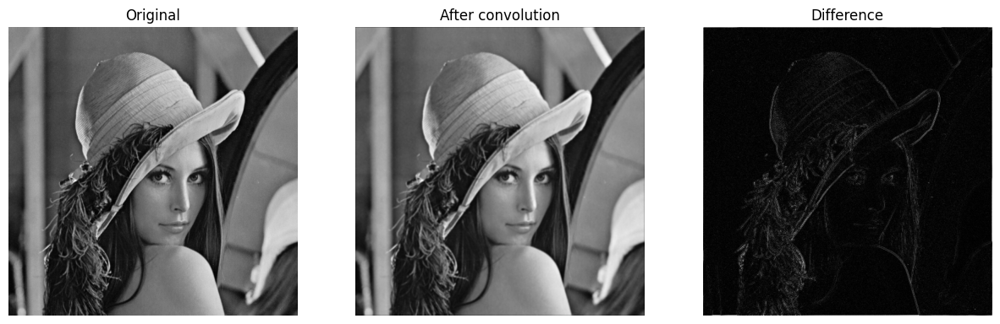

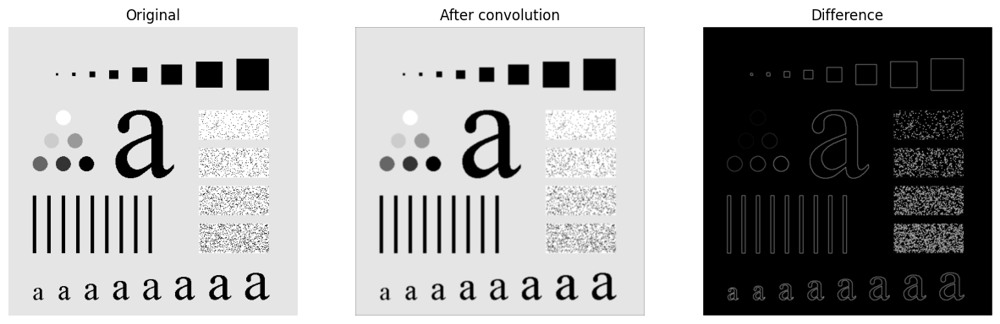

In [6]:
M = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])
M = M / np.sum(M)
imgs = [read_image(img_path) for img_path in fileNames]
for img in imgs:
    draw_convolution(img, M)

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
   Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa.
   Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
   Wykorzystując funkcję `mesh` zwizualizuj filtr.
   Sprawdź jak parametr `odchylenie standardowe` wpływa na `kształt` filtru.

Uwaga. W OpenCV dostępna jest _dedykowana_ funkcja do filtracji Gaussa - `GaussianBlur`.
Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


In [7]:
def fgaussian(size, sigma):
    m = n = size
    h, k = m//2, n//2
    x, y = np.mgrid[-h:h+1, -k:k+1]
    g = np.exp(-(x**2 + y**2)/(2*sigma**2))
    return g / g.sum()


def mesh(fun, size):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')

    X = np.arange(-size//2, size//2, 1)
    Y = np.arange(-size//2, size//2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun

    ax.plot_surface(X, Y, Z)

    plt.show()

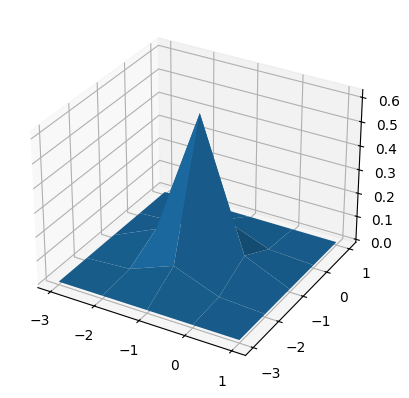

In [8]:
gaussian = fgaussian(5, 0.5)
mesh(gaussian, 5)

Sigma: 0.5
Sigma: 5
Sigma: 10


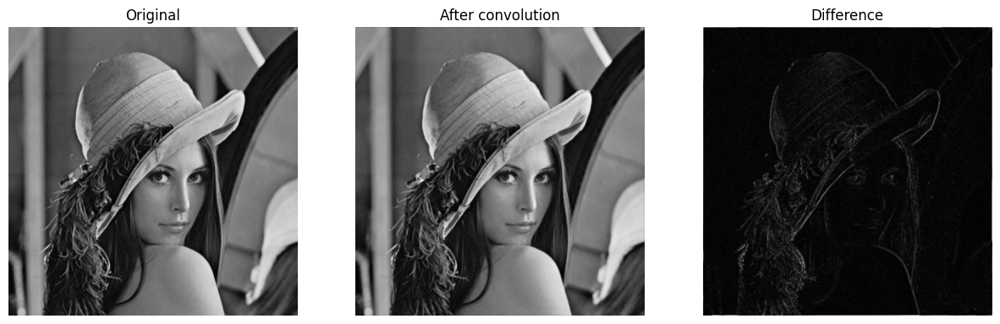

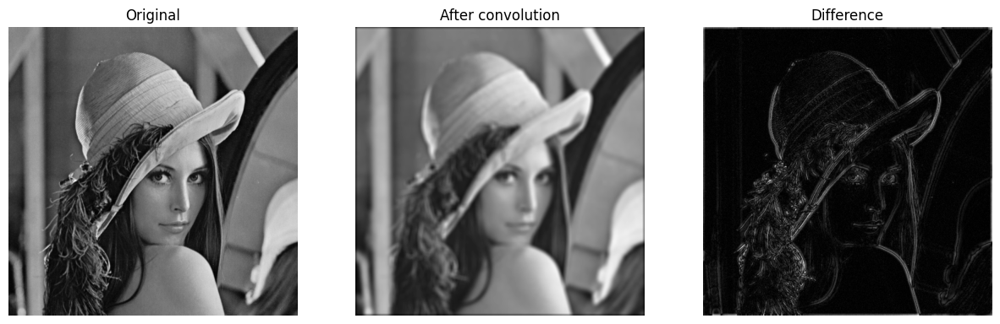

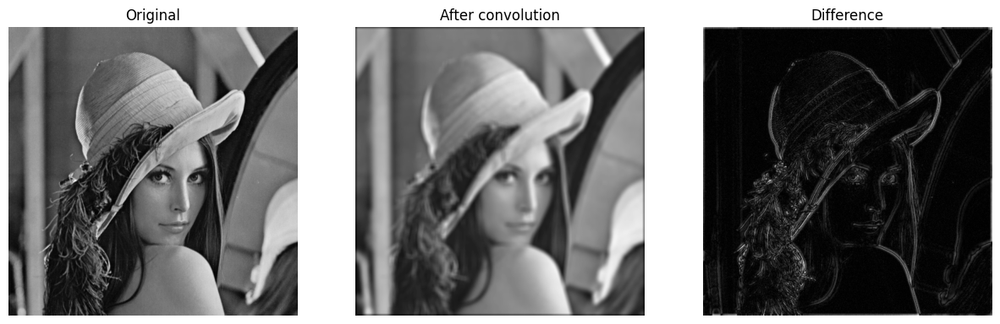

In [9]:
for sigma in [0.5, 5, 10]:
    gaussian = fgaussian(9, sigma)
    print(f'Sigma: {sigma}')
    draw_convolution(read_image('lena.png'), gaussian)

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).

1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


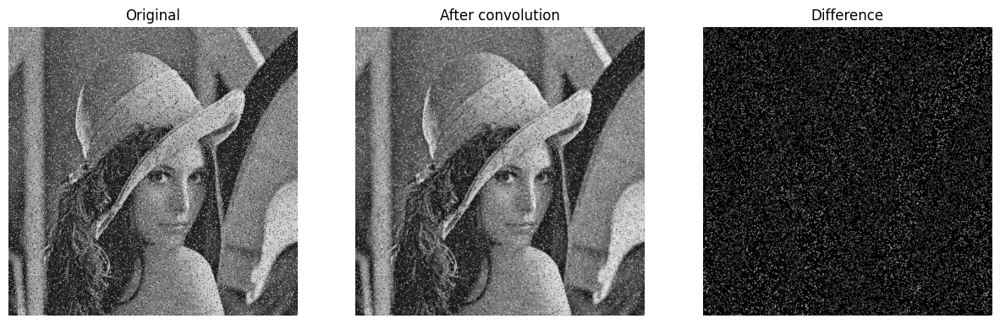

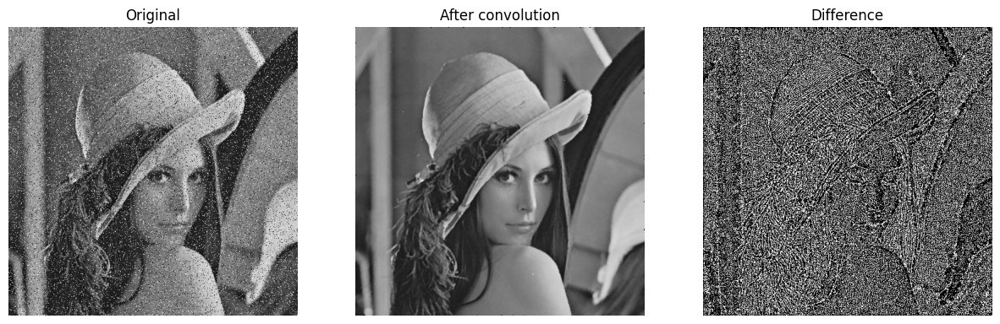

In [10]:
img = read_image('lenaSzum.png')
draw_convolution(img, fgaussian(3, 0.5))
draw_convolution(img, 3, filter_image_nonlinear)

2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?


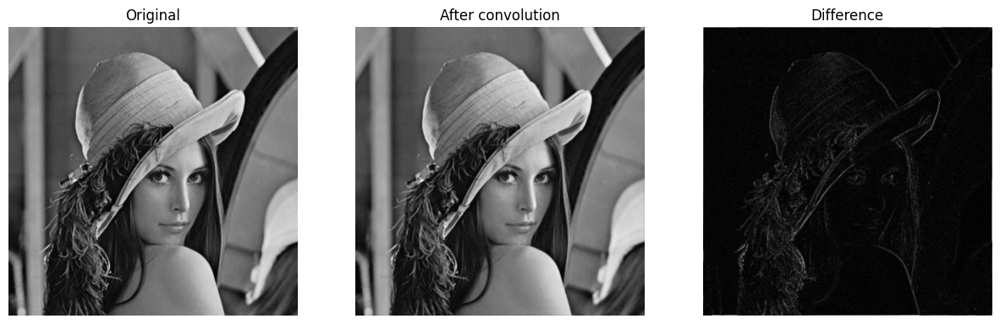

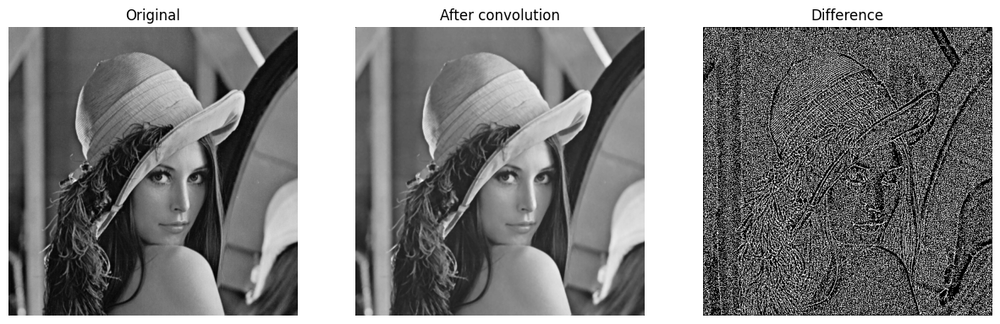

In [11]:
img = read_image('lena.png')
draw_convolution(img, fgaussian(3, 0.5))
draw_convolution(img, 3, filter_image_nonlinear)

3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem posteryzacji. W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności. Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


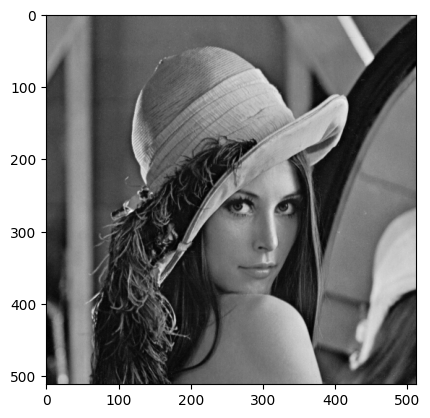

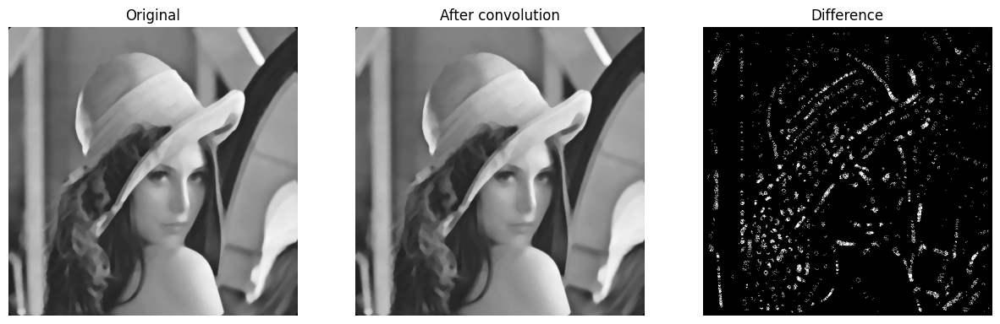

In [12]:
img = read_image('lena.png')
plt.imshow(img, 'gray')
for _ in range(9):
    img = filter_image_nonlinear(img, 5)

draw_convolution(img, 5, filter_image_nonlinear)

Inne filtry nieliniowe:

- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt `x'',`+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z `x'' i mediana z `+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).

Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.


## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
   \begin{equation}
   M =
   \begin{bmatrix}
   0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
   \end{bmatrix}
   \end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:

- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje.
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach.


Text(0.5, 1.0, 'Laplasjan (abs to each pixel)')

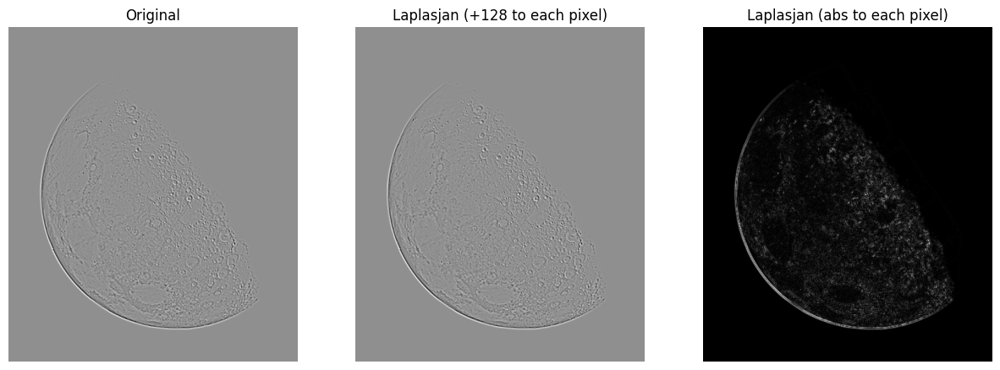

In [13]:
img = read_image('moon.png')
M = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
M = M / 9
img = filter_image_linear(img, M)
filtered_img1 = img + 128
filtered_img2 = np.abs(img)

_, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(img, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original')
axs[1].imshow(filtered_img1, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Laplasjan (+128 to each pixel)')
axs[2].imshow(filtered_img2, cmap='gray')
axs[2].axis('off')
axs[2].set_title('Laplasjan (abs to each pixel)')

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
   Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.


Text(0.5, 1.0, '| Original-filtered |')

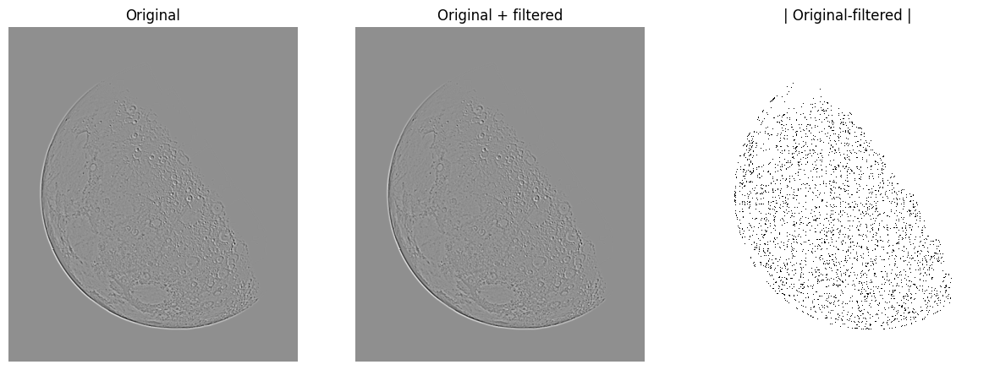

In [14]:
img = read_image('moon.png').astype(int)
M = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
M = M / 9
img = filter_image_linear(img, M)
filtered_img1 = img + 128

_, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(img, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original')
axs[1].imshow(img+filtered_img1, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Original + filtered')
axs[2].imshow(np.abs(img-filtered_img1), cmap='gray')
axs[2].axis('off')
axs[2].set_title('| Original-filtered |')

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
   \begin{equation}
   R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}  
   R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
   \end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
   \begin{equation}
   P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}  
   P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
   \end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
   \begin{equation}
   S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}  
   S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
   \end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela.


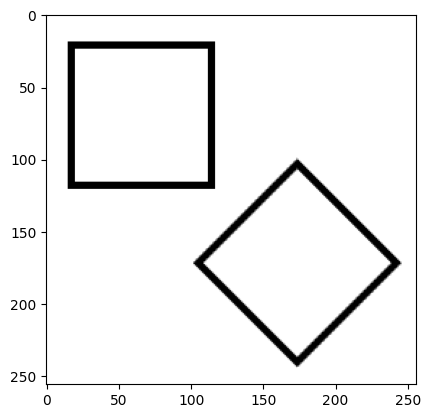

In [15]:
img = read_image('kw.png')
plt.imshow(img, 'gray')

Text(0.5, 1.0, 'R2')

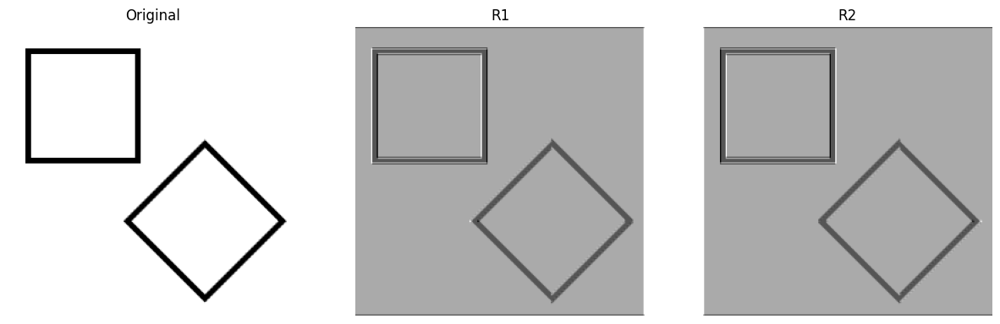

In [16]:
filtered_img1 = filter_image_linear(
    img, np.array([[0, 1, 0], [-1, 0, 0], [0, 1, 0]]))
filtered_img2 = filter_image_linear(
    img, np.array([[0, 1, 0], [0, 0, -1], [0, 1, 0]]))

_, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(img, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original')
axs[1].imshow(filtered_img1, cmap='gray')
axs[1].axis('off')
axs[1].set_title('R1')
axs[2].imshow(filtered_img2, cmap='gray')
axs[2].axis('off')
axs[2].set_title('R2')

Text(0.5, 1.0, 'P2')

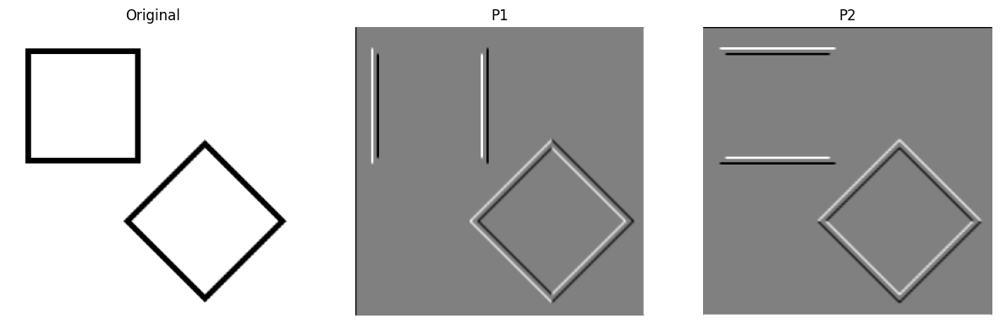

In [17]:
filtered_img1 = filter_image_linear(
    img, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
filtered_img2 = filter_image_linear(
    img, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))

_, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(img, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original')
axs[1].imshow(filtered_img1, cmap='gray')
axs[1].axis('off')
axs[1].set_title('P1')
axs[2].imshow(filtered_img2, cmap='gray')
axs[2].axis('off')
axs[2].set_title('P2')

Text(0.5, 1.0, 'S2')

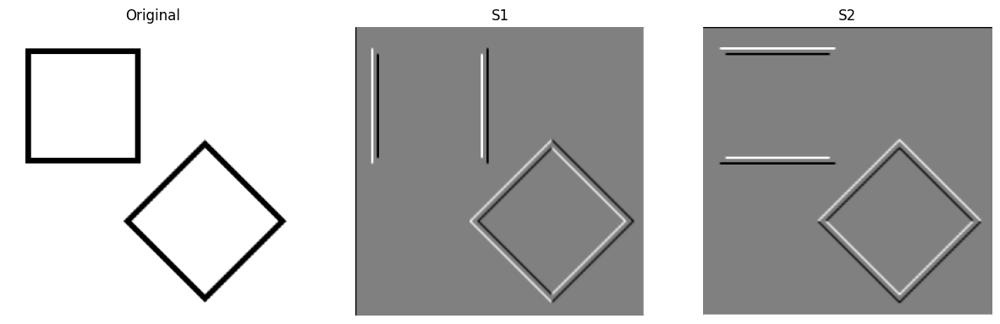

In [18]:
S1 = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
filtered_img1 = filter_image_linear(
    img, S1)
S2 = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
filtered_img2 = filter_image_linear(
    img, S2)

_, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(img, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original')
axs[1].imshow(filtered_img1, cmap='gray')
axs[1].axis('off')
axs[1].set_title('S1')
axs[2].imshow(filtered_img2, cmap='gray')
axs[2].axis('off')
axs[2].set_title('S2')

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
   \begin{equation}
   OW = \sqrt{(O _ S1)^2 + (O _ S2)^2}
   \end{equation}
   gdzie: $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem


In [19]:
def combined_filter_squared(img, M1, M2):
    img = img.astype(int)
    return np.sqrt(np.pow(filter_image_linear(img, M1), 2) + np.pow(filter_image_linear(img, M2), 2))

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia).
   Zaimplementuj tę wersję.


In [20]:
def combined_filter_abs(img, M1, M2):
    img = img.astype(int)
    return np.abs(filter_image_linear(img, M1)) + np.abs(filter_image_linear(img, M2))

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
   Sprawdź działanie obu wariantów filtracji kombinowanej.


Text(0.5, 1.0, 'Abs')

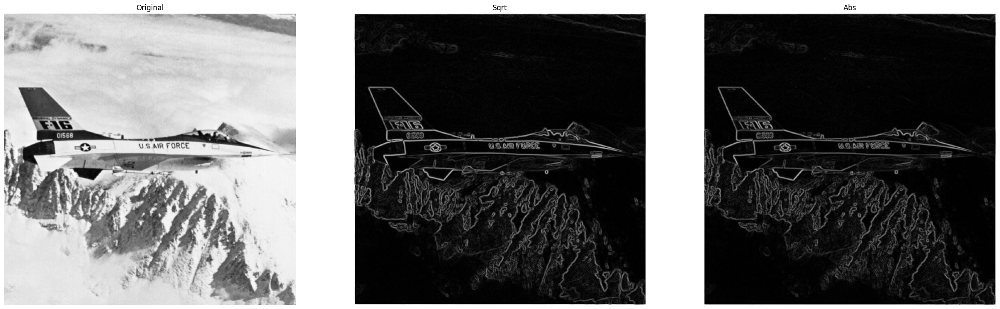

In [21]:

img = read_image('jet.png')
img_sqrt = combined_filter_squared(img, S1, S2)
img_abs = combined_filter_abs(img, S1, S2)

_, axs = plt.subplots(1, 3, figsize=(30, 30))
axs[0].imshow(img, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original')
axs[1].imshow(img_sqrt, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Sqrt')
axs[2].imshow(img_abs, cmap='gray')
axs[2].axis('off')
axs[2].set_title('Abs')